In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import random
from pathlib import Path

In [2]:
csv_path = "train_split.csv"
img_dir = Path("data/train_denoised")

df = pd.read_csv(csv_path)

print(df.head())

                ID label
0  train_24525.png    LY
1  train_14985.png   SNE
2  train_02956.png    LY
3  train_06140.png    LY
4  train_08030.png   SNE


In [3]:
def crop_contour(image):
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    _, thresh = cv2.threshold(gray, 0, 255, cv2.THRESH_OTSU)

    contours, _ = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    if len(contours) == 0:
        return image

    cnt = max(contours, key=cv2.contourArea)
    x, y, w, h = cv2.boundingRect(cnt)

    pad = int(0.2 * max(w, h))
    x = max(0, x - pad)
    y = max(0, y - pad)
    w = min(image.shape[1] - x, w + 2*pad)
    h = min(image.shape[0] - y, h + 2*pad)

    return image[y:y+h, x:x+w]

In [4]:
def crop_hsv(image):
    hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)

    lower = np.array([100, 50, 50])
    upper = np.array([140, 255, 255])

    mask = cv2.inRange(hsv, lower, upper)

    contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    if len(contours) == 0:
        return image

    cnt = max(contours, key=cv2.contourArea)
    x, y, w, h = cv2.boundingRect(cnt)

    pad = int(0.2 * max(w, h))
    x = max(0, x - pad)
    y = max(0, y - pad)
    w = min(image.shape[1] - x, w + 2*pad)
    h = min(image.shape[0] - y, h + 2*pad)

    return image[y:y+h, x:x+w]

In [5]:
def crop_center(image, size=224):
    h, w = image.shape[:2]
    cx, cy = w // 2, h // 2

    half = size // 2
    return image[cy-half:cy+half, cx-half:cx+half]

In [6]:
def crop_none(image):
    return image

In [7]:
def show_comparison(image, title=""):
    methods = {
        "Original": crop_none,
        "Contour": crop_contour,
        "HSV": crop_hsv,
        "Center": crop_center
    }

    plt.figure(figsize=(12, 6))

    for i, (name, func) in enumerate(methods.items()):
        cropped = func(image)
        cropped = cv2.resize(cropped, (224, 224))

        plt.subplot(1, len(methods), i+1)
        plt.imshow(cv2.cvtColor(cropped, cv2.COLOR_BGR2RGB))
        plt.title(name)
        plt.axis("off")

    plt.suptitle(title)
    plt.show()

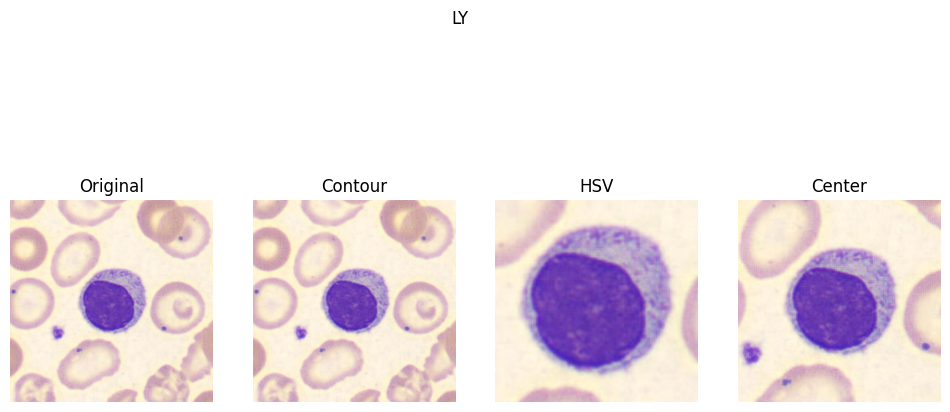

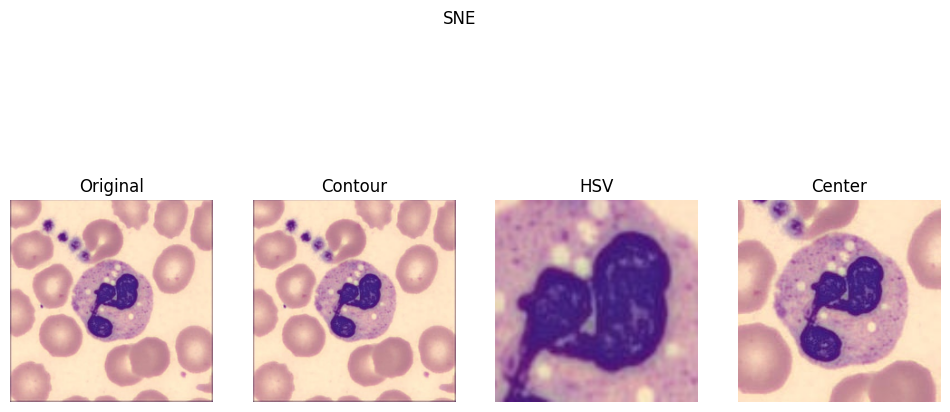

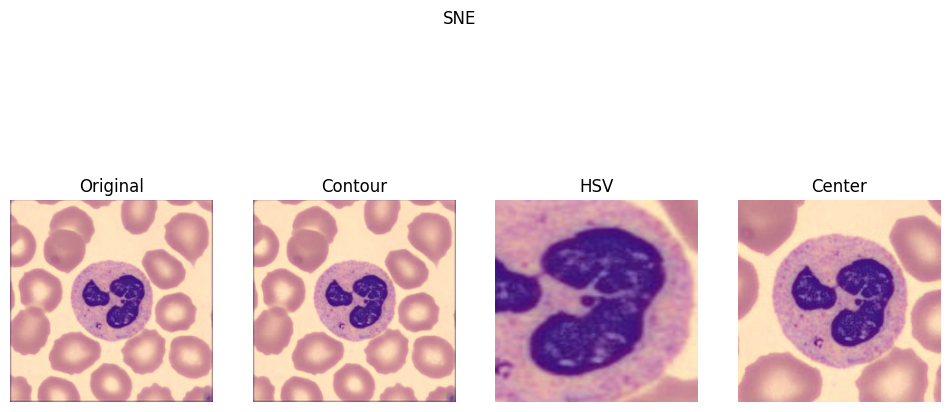

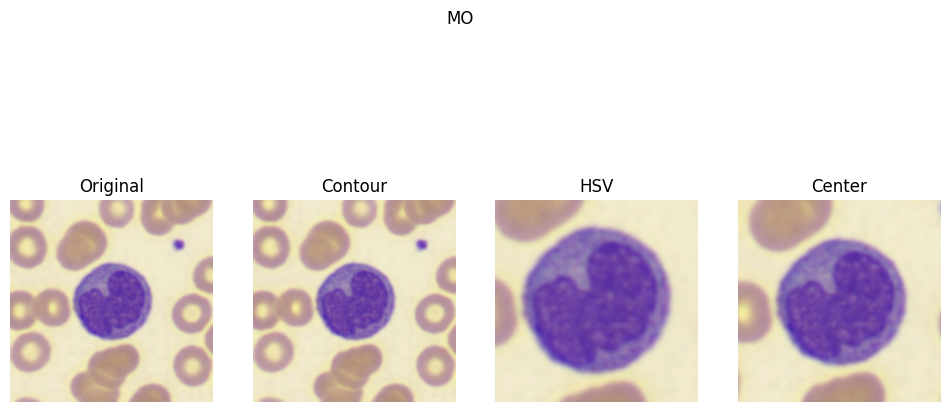

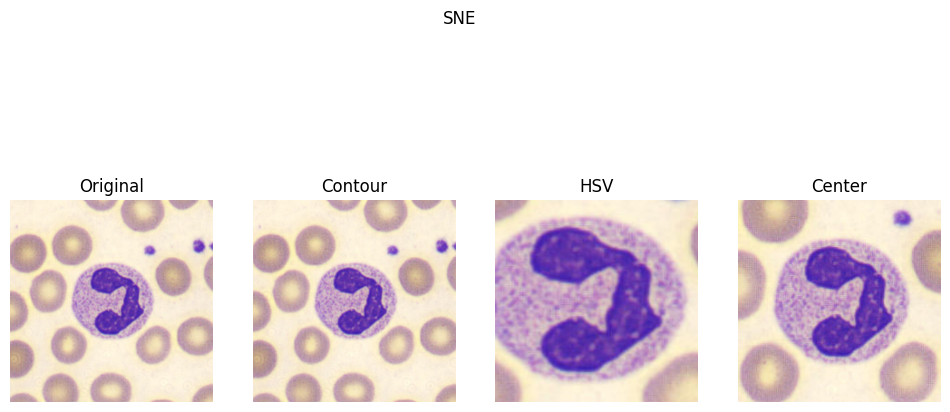

...

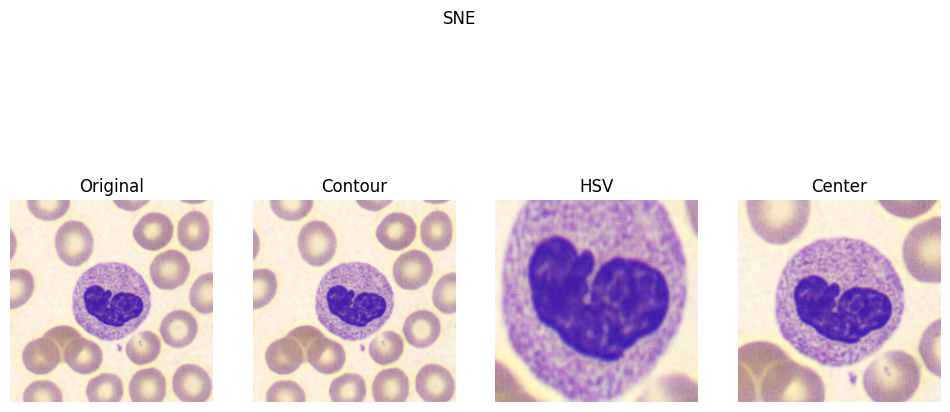

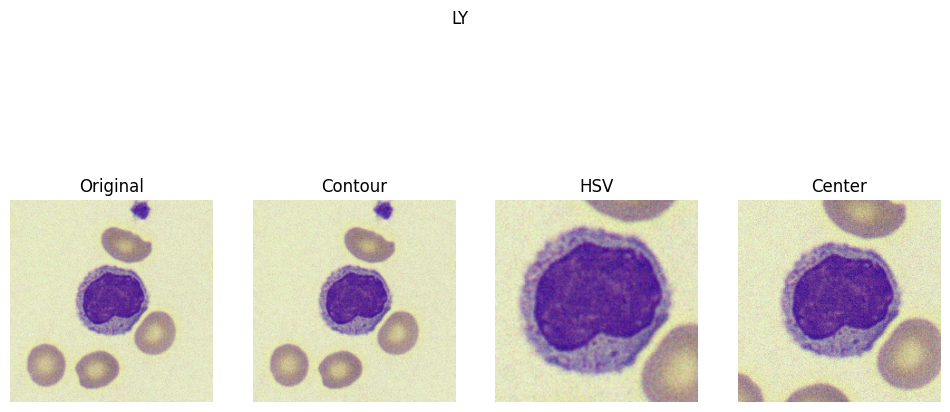

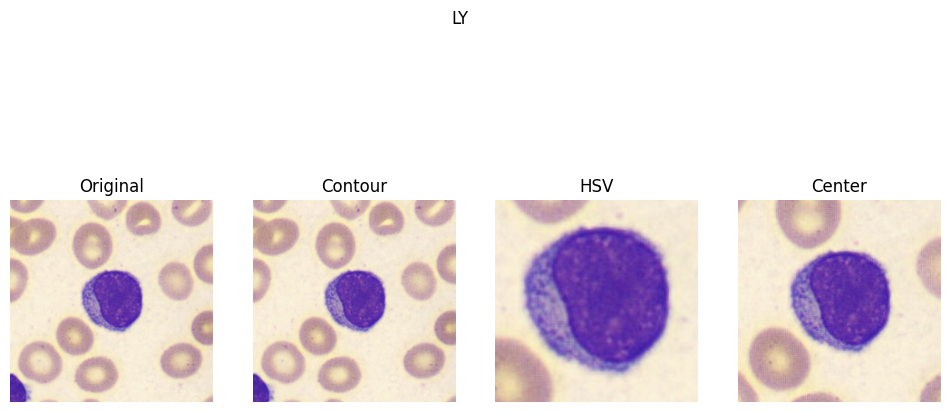

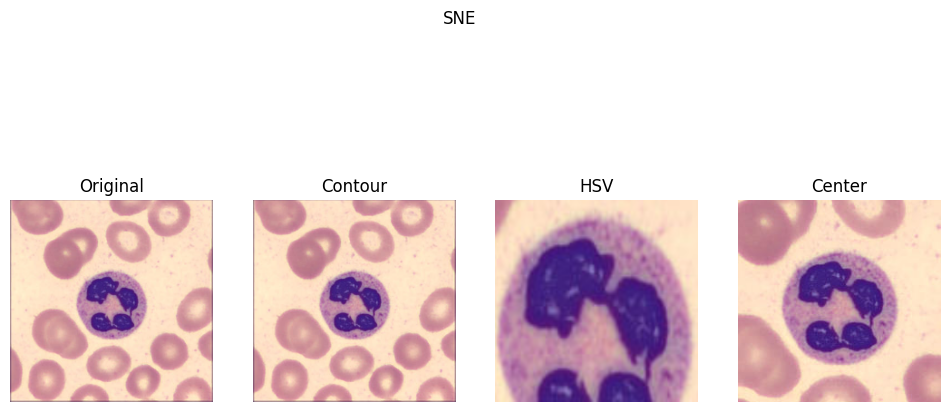

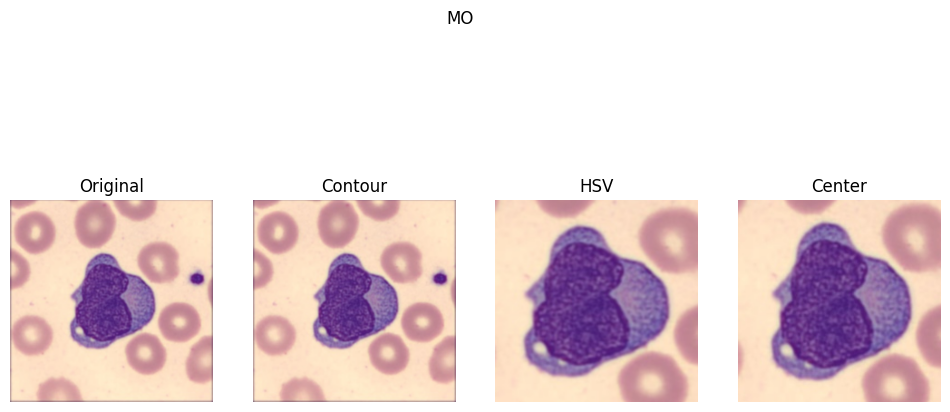

In [11]:
for _ in range(20):
    row = df.sample(1).iloc[0]
    img_path = img_dir / row["ID"]

    image = cv2.imread(str(img_path))

    show_comparison(image, title=row["label"])

In [15]:
def plot_lineage(df, img_dir, classes, n_rows=5):
    """
    Each row = one random sample per class
    Each column = one class
    """
    plt.figure(figsize=(3 * len(classes), 3 * n_rows))

    # Sample n_rows per class
    samples = {
        c: df[df["label"] == c].sample(n_rows, replace=True).reset_index(drop=True)
        for c in classes
    }

    for i in range(n_rows):
        for j, c in enumerate(classes):
            img_path = img_dir / samples[c].iloc[i]["ID"]
            image = cv2.imread(str(img_path))
            image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

            plt.subplot(n_rows, len(classes), i * len(classes) + j + 1)
            plt.imshow(image)

            if i == 0:
                plt.title(c)

            plt.axis("off")

    plt.suptitle(" → ".join(classes), fontsize=14)
    plt.tight_layout()
    plt.show()

In [13]:
myeloid = ["MY", "PMY", "MMY"]
neutrophil = ["BNE", "SNE"]
lymphoid = ["LY", "VLY", "PLY"]

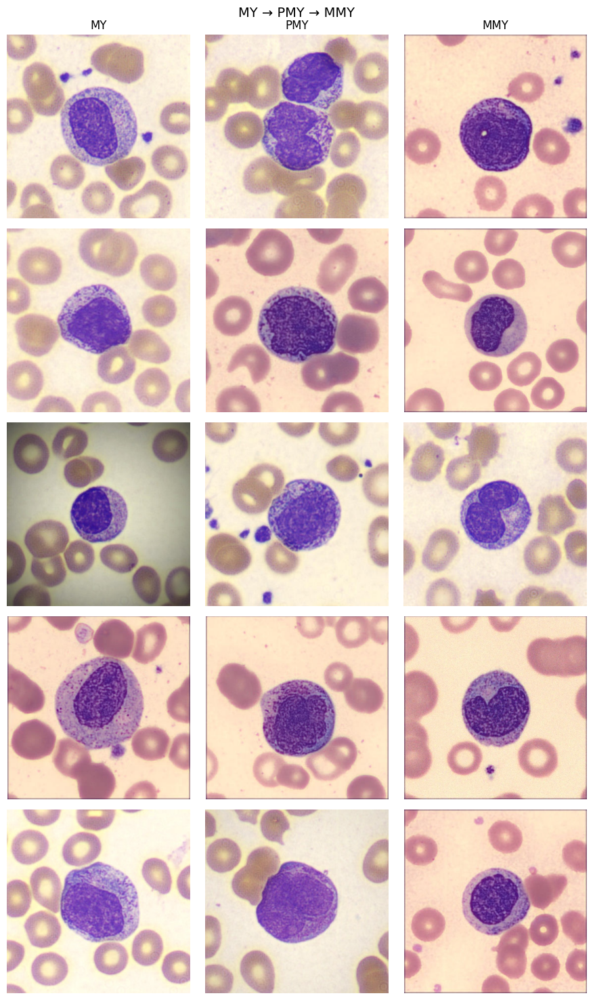

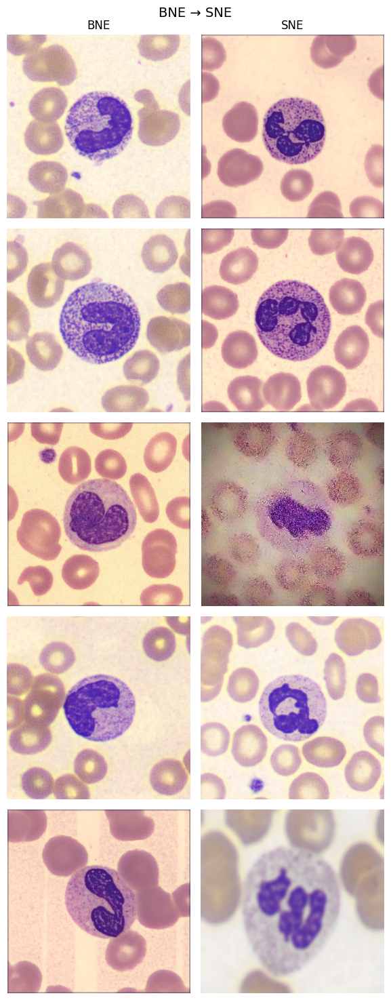

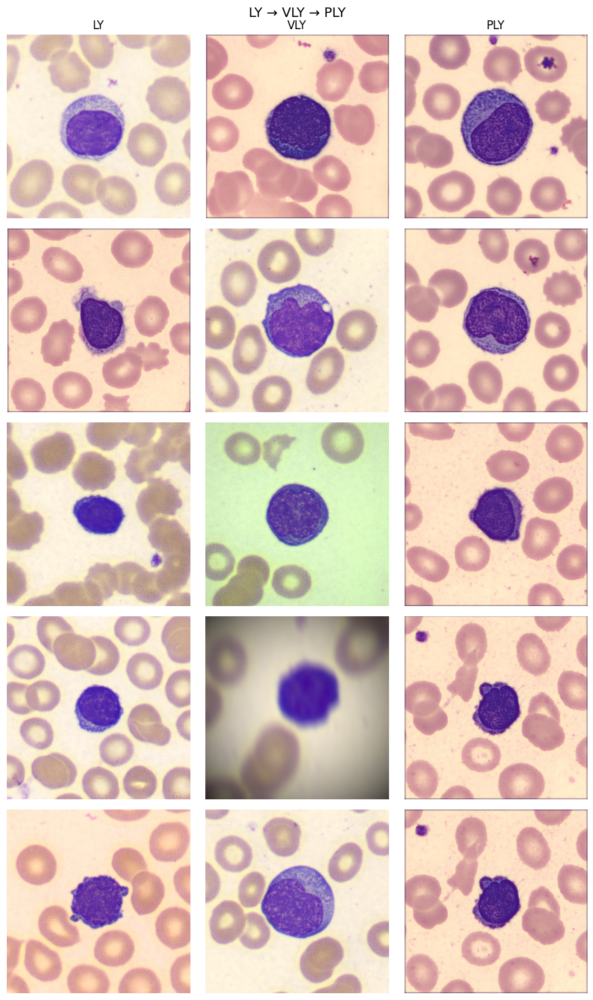

In [16]:
plot_lineage(df, img_dir, myeloid, n_rows=5)
plot_lineage(df, img_dir, neutrophil, n_rows=5)
plot_lineage(df, img_dir, lymphoid, n_rows=5)